# 10) Model Deployment and Inference
In the context of this project, Inference refers to the operational phase where the trained Faster R-CNN model is deployed to perform object detection on novel, unseen camera trap imagery.

The transition from a trained checkpoint to a functional deployment requires an optimized inference pipeline, which follows these distinct stages:

- Model Export (SavedModel Format)

The raw training checkpoints, which contain metadata for both training and optimization, are converted into a Graph Protocol Buffer (SavedModel). This process strips away training-specific parameters (like the Adam optimizer state) to minimize file size and maximize computational speed, resulting in a standalone "Inference Graph."

- Image Pre-processing

Upon receiving a raw $2048 \times 1536$ image, the inference engine automatically applies a fixed-shape resizer. The image is scaled to $1024 \times 1024$ pixels to match the dimensions the model was trained on, ensuring that the feature extractor (ResNet-101) perceives textures and edges at the expected scale.

- The Forward Pass

Feature Extraction: The ResNet-101 backbone extracts deep hierarchical features.

Region Proposals: The Region Proposal Network (RPN) suggests candidate areas likely to contain an animal.

Classification & Regression: The second-stage head assigns a species label (Oryx, Lion, or Ostrich) and refines the bounding box coordinates.

- Post-processing (Non-Maximum Suppression)

To resolve the issue of the model predicting multiple overlapping boxes for a single animal, Non-Maximum Suppression (NMS) is applied. This algorithm keeps only the box with the highest confidence score and suppresses redundant detections, ensuring a clean and accurate final count.


In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import pathlib
import tensorflow as tf

tf.get_logger().setLevel('ERROR')

# enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
IMAGE_PATHS = "C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/inference"

In [3]:
PATH_TO_MODEL = 'faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8'

In [4]:
PATH_TO_MODEL_DIR = "C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/exported_models/FasterRCNN_Final/saved_model"

In [5]:
print (PATH_TO_MODEL_DIR)

C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/exported_models/FasterRCNN_Final/saved_model


In [6]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 12.30670428276062 seconds


In [7]:
PATH_TO_LABELS = "C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/label_map.pbtxt"

In [8]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [9]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array and ensure it is in RGB format."""
  try:
    image = Image.open(path)
    if image.mode != 'RGB':
      image = image.convert('RGB') 
    return np.array(image)
  except IOError as e:
    # This check remains important for any file PIL cannot open.
    return None

Running inference for OryxGazella_CDB_S1_B07_R1_IMAG0255.jpg...Done


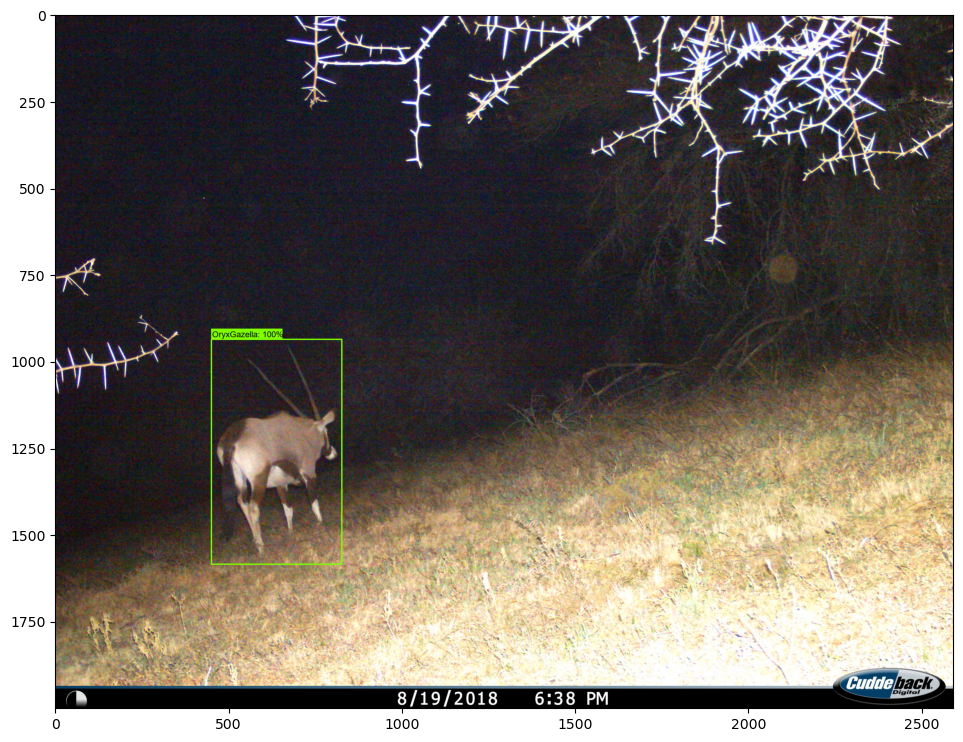

Running inference for OryxGazella_CDB_S1_C06_R1_IMAG0434.jpg...Done


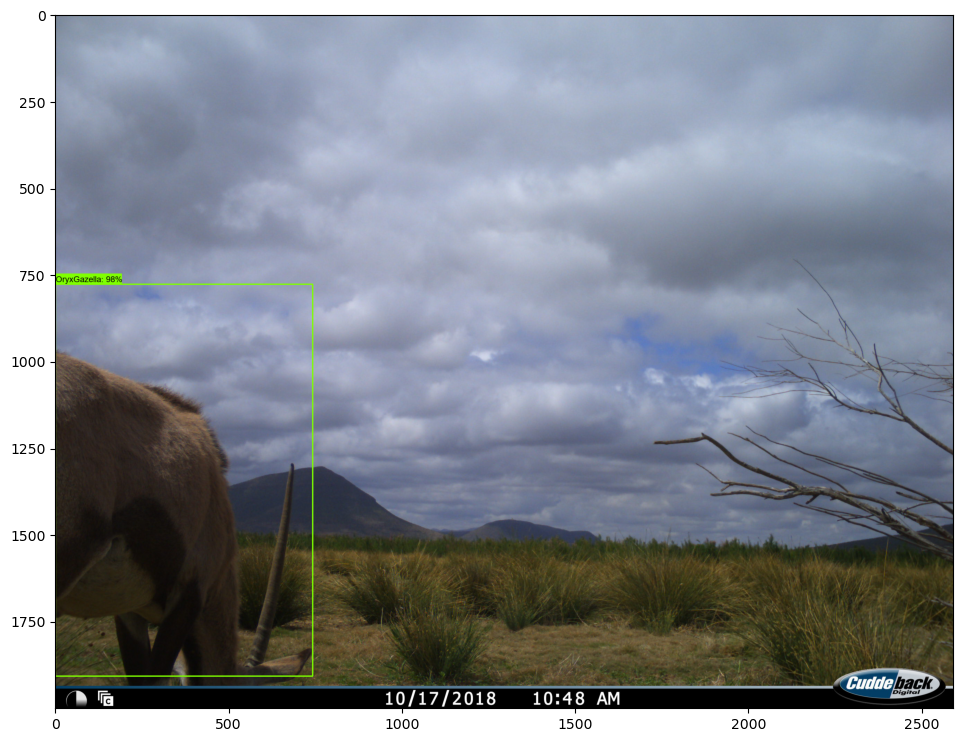

Running inference for OryxGazella_CDB_S1_C06_R2_IMAG0255.jpg...Done


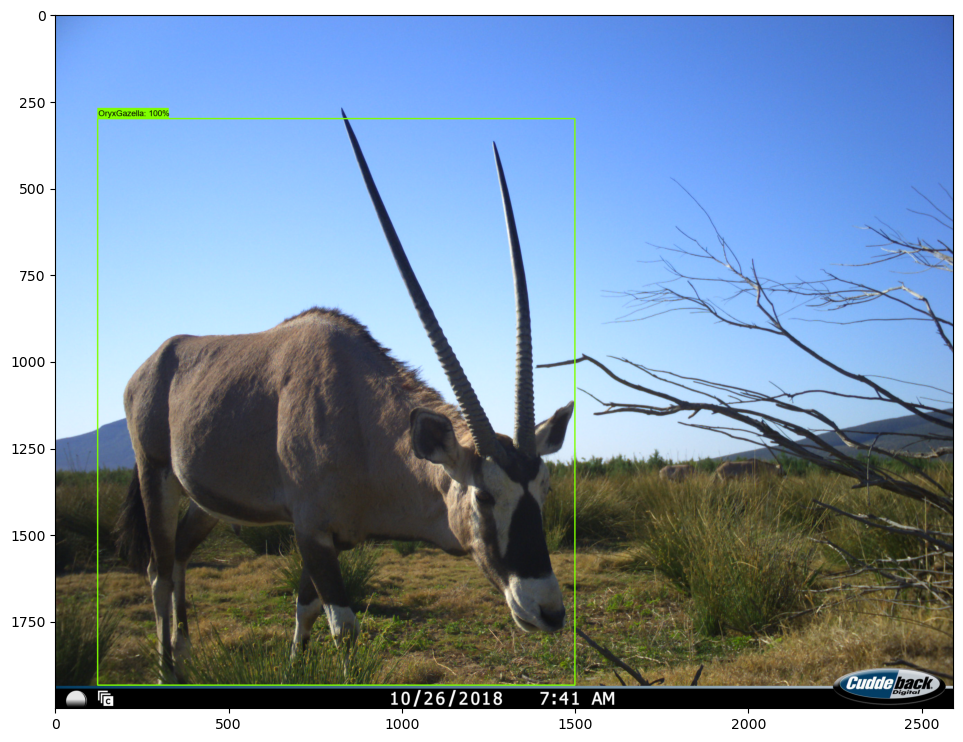

Running inference for OryxGazella_CDB_S1_D02_R2_IMAG0610.jpg...Done


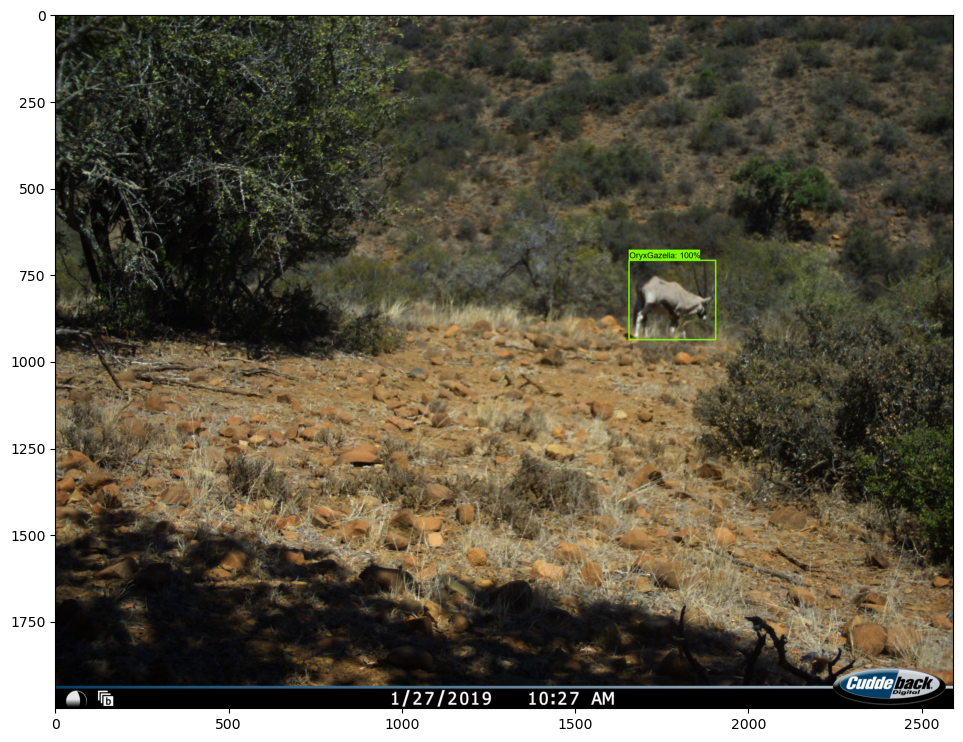

Running inference for OryxGazella_CDB_S1_D03_R1_IMAG0063.jpg...Done


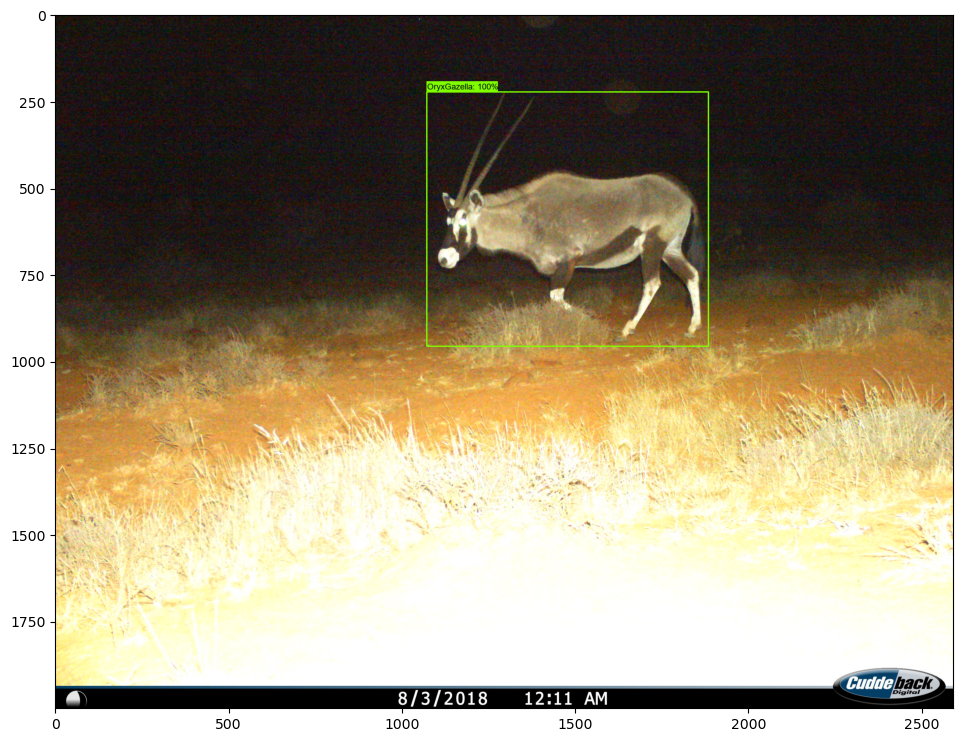

Running inference for PantheraLeo010.jpg...Done


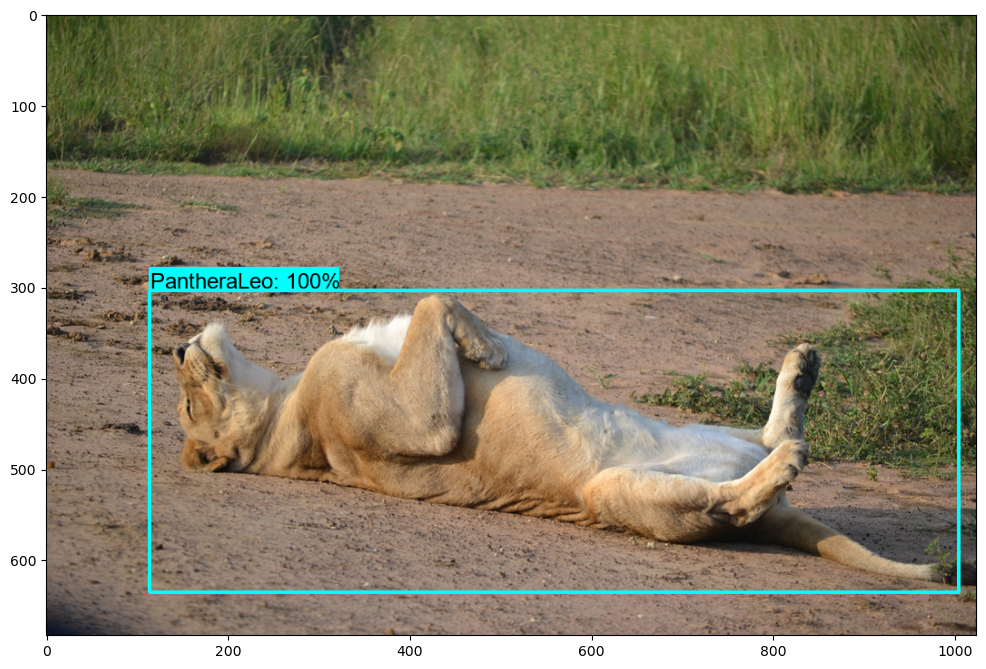

Running inference for PantheraLeo020.jpg...Done


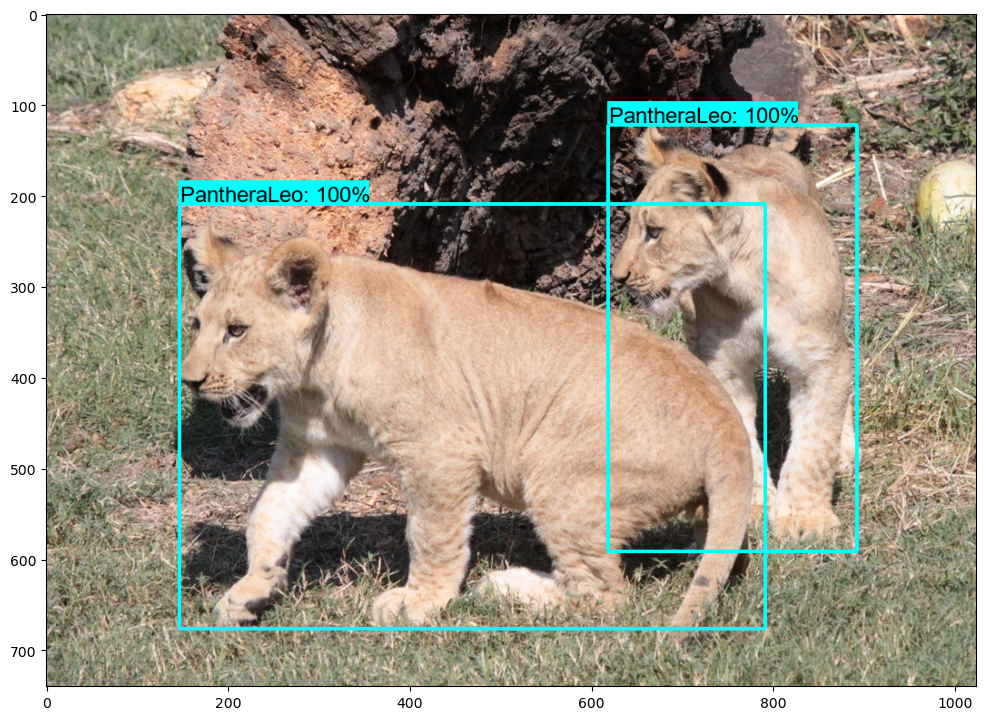

Running inference for PantheraLeo032.jpg...Done


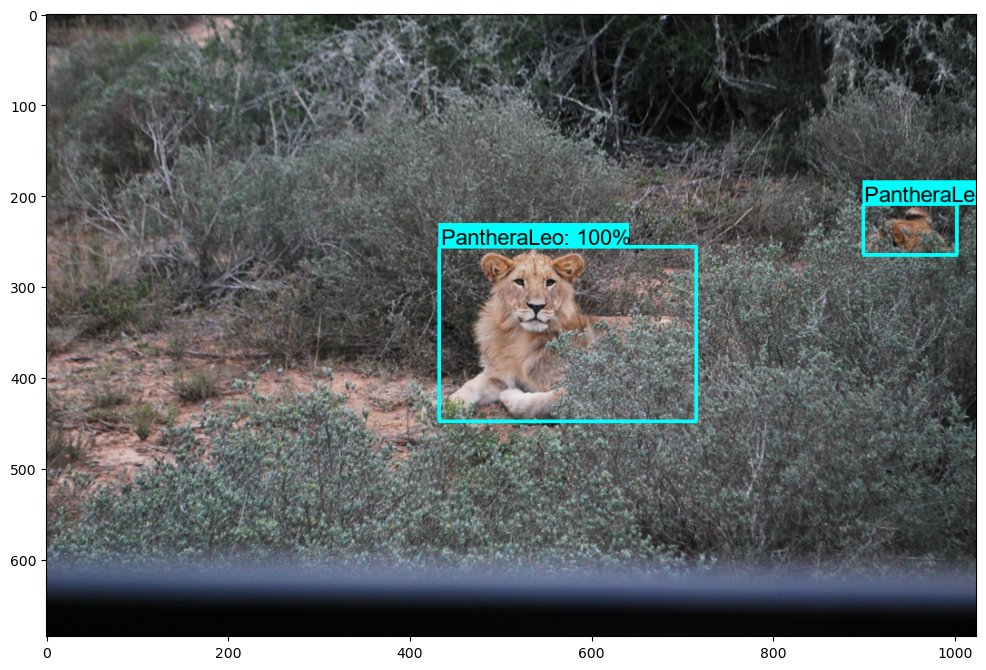

Running inference for PantheraLeo0908.jpg...Done


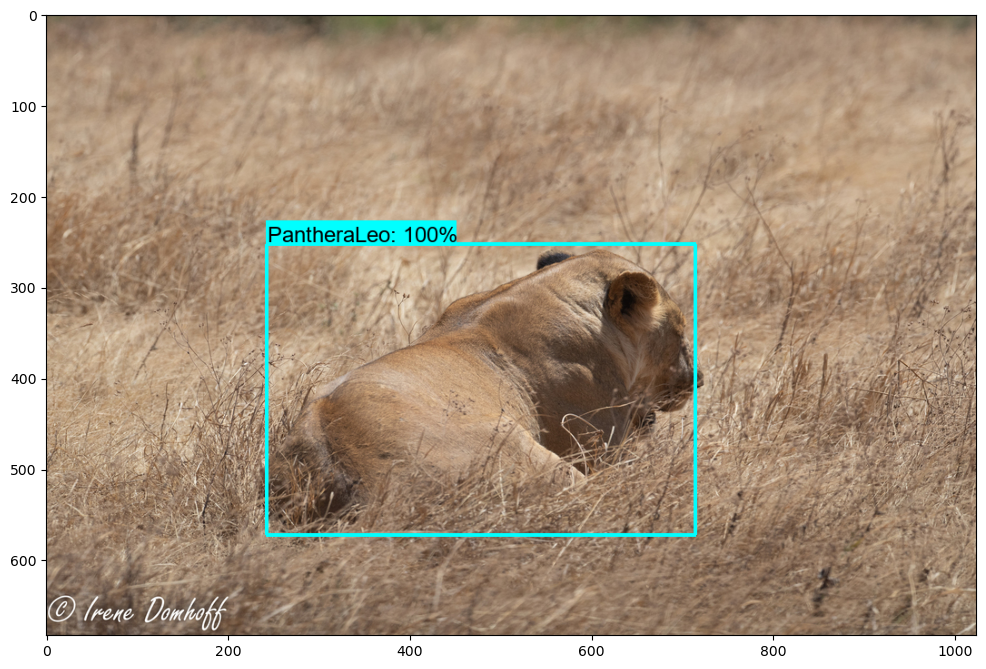

Running inference for StruthioCamelus_0435S6_Q05_R1_IMAG0028.jpg...Done


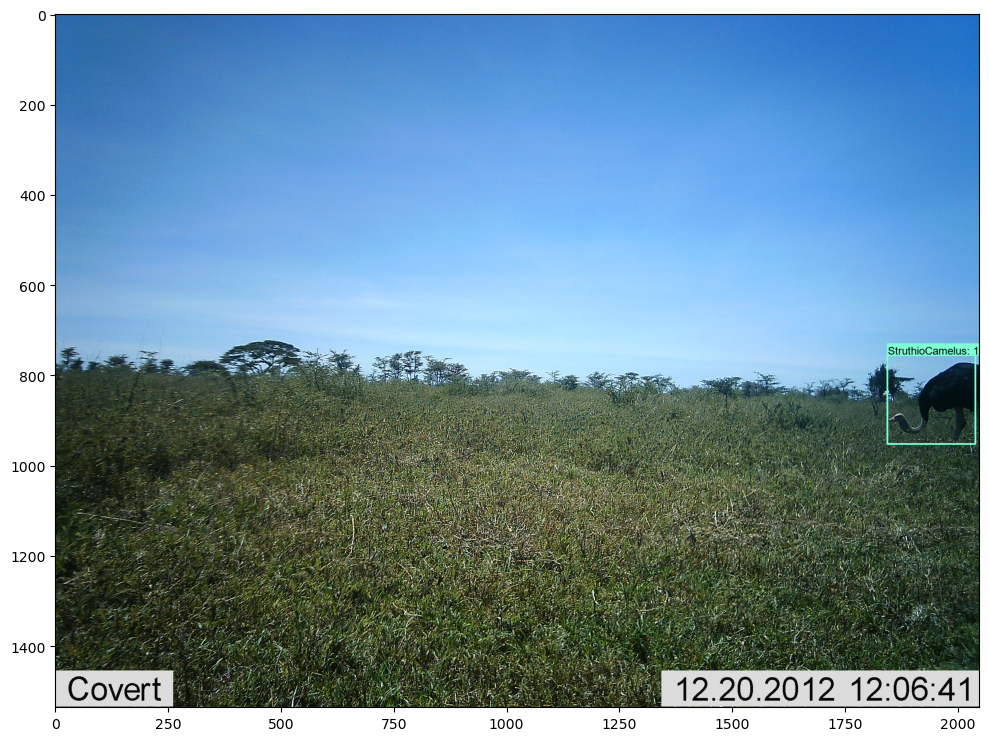

Running inference for StruthioCamelus_0645S7_B09_R3_IMAG1768.jpg...Done


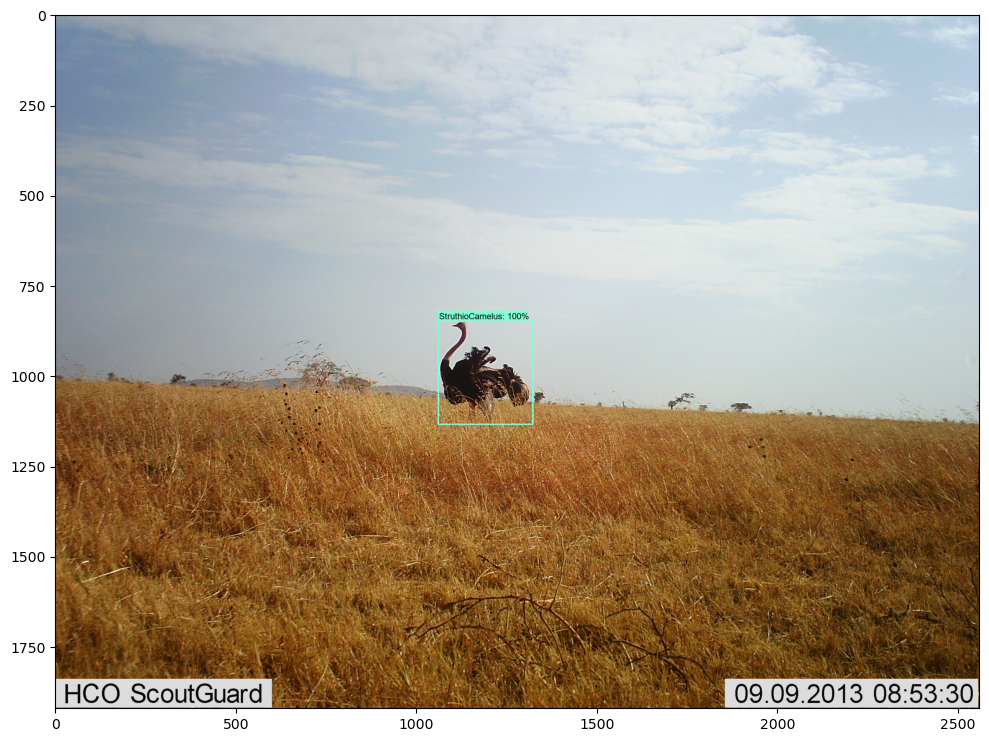

Running inference for StruthioCamelus_2215S7_M09_R2_IMAG0095.jpg...Done


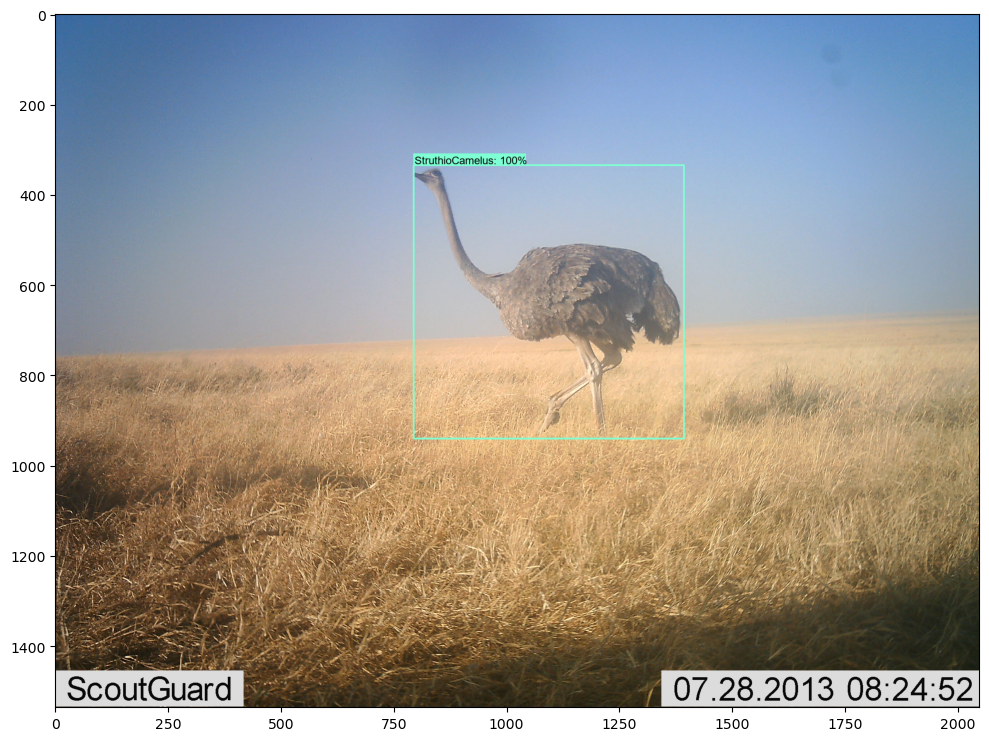

In [22]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# 3. Inference Loop and Visualization
# (From image_a983c5.png, image_a92249.png, and user request to skip XML)
for file_name in os.listdir(IMAGE_PATHS):
  
  image_path = os.path.join(IMAGE_PATHS, file_name)

  print('Running inference for {}...'.format(file_name), end='')
  
  image_np = load_image_into_numpy_array(image_path)
  if image_np is None:
    continue # Skip if load_image_into_numpy_array returned None

  # Prepare image for model: convert to tensor and add batch dimension
  input_tensor = tf.convert_to_tensor(image_np)
  # The shape is now (1, Height, Width, 3)
  input_tensor = input_tensor[tf.newaxis, ...]

  # Run detection
  detections = detect_fn(input_tensor)

  # Process detections output
  num_detections = int(detections.pop('num_detections'))
  detections = {key: value[0, :num_detections].numpy()
                for key, value in detections.items()}
  detections['num_detections'] = num_detections

  # detection_classes must be ints for visualization
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

  image_np_with_detections = image_np.copy()

  # Visualize bounding boxes and labels
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.75,
      agnostic_mode=False)

  # Display the resulting image
  plt.figure(figsize=(12, 9))
  plt.imshow(image_np_with_detections)
  print('Done')
  plt.show()